In [21]:
from scipy.io import loadmat

# Load the .mat file
data = loadmat('focus=(0.00,0.00,0.00)_volt=15.mat')

# Display the keys in the loaded data
print(data.keys())

dict_keys(['__header__', '__version__', '__globals__', 'hydroData', 'useElem', 'xPos', 'yPos', 'zPos', 'indFine', 'posFine', 'hydrophone'])


In [22]:
import numpy as np
hydroData = data['hydroData']

hydroData_max = np.max(np.abs(hydroData), axis=0)
# Reshape hydroData_max to match the shape of posFine
hydroData_max_reshaped = hydroData_max.reshape(data['posFine'].shape[0], -1)

# Create a new array to hold the values in the grid with an additional column
grid_values = np.zeros((data['posFine'].shape[0], data['posFine'].shape[1] + 1))

# Assign the reshaped hydroData_max values to the grid
grid_values[:, :3] = data['posFine']
grid_values[:, 3] = hydroData_max_reshaped.flatten()




(array([227., 617., 160., 130.,  95.,  51.,  19.,   6.,   3.,   1.]),
 array([ 4.46638386,  5.26657918,  6.0667745 ,  6.86696982,  7.66716514,
         8.46736045,  9.26755577, 10.06775109, 10.86794641, 11.66814173,
        12.46833705]),
 <BarContainer object of 10 artists>)

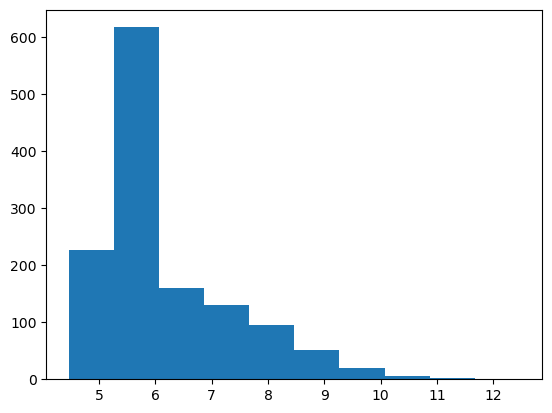

In [23]:
import matplotlib.pyplot as plt
plt.hist(hydroData_max)

(array([2.600000e+01, 1.000000e+00, 3.000000e+00, 2.000000e+00,
        0.000000e+00, 0.000000e+00, 1.000000e+00, 4.000000e+00,
        4.000000e+00, 3.000000e+00, 7.000000e+00, 2.000000e+00,
        5.000000e+00, 4.000000e+00, 1.000000e+00, 7.000000e+00,
        4.000000e+00, 5.000000e+00, 4.000000e+00, 7.000000e+00,
        1.000000e+01, 1.300000e+01, 1.400000e+01, 6.000000e+00,
        2.600000e+01, 2.900000e+01, 2.400000e+01, 3.600000e+01,
        4.800000e+01, 2.900000e+01, 3.600000e+01, 3.800000e+01,
        4.100000e+01, 4.300000e+01, 5.400000e+01, 5.000000e+01,
        4.700000e+01, 5.700000e+01, 1.000000e+02, 1.520000e+02,
        1.670000e+02, 1.760000e+02, 2.170000e+02, 2.850000e+02,
        4.710000e+02, 7.370000e+02, 4.247000e+03, 1.314500e+04,
        2.683400e+04, 1.999750e+06, 2.218404e+06, 4.548700e+04,
        4.933000e+03, 1.464000e+03, 6.970000e+02, 3.510000e+02,
        2.840000e+02, 2.290000e+02, 1.800000e+02, 1.080000e+02,
        1.020000e+02, 9.700000e+01, 8.60

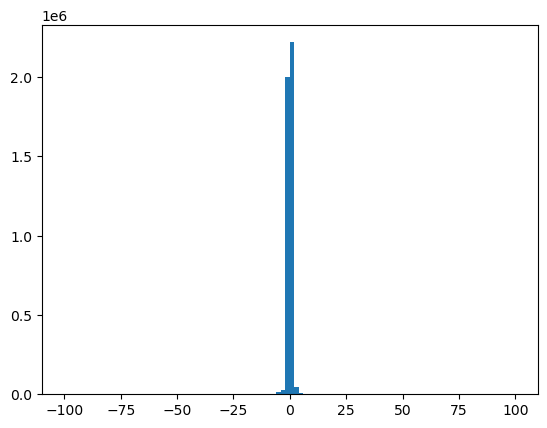

In [30]:
plt.hist(hydroData.flatten(),bins=100)

In [91]:
import plotly.graph_objects as go
import numpy as np

# Debug: Print min/max
print("hydroData_max range:", hydroData_max.min(), hydroData_max.max())

# Simplify and restructure data for go.Volume rendering

# Create a regular grid for x, y, z


# Reshape value into a 3D grid that matches the unique x, y, z grid points
# Assuming values align with (x, y, z) coordinates in a grid-like fashion
try:
    # value_grid = value.reshape(len(grid_x), len(grid_y), len(grid_z))

    # Create the volume plot with the restructured data
    fig = go.Figure(data=go.Volume(
        x=x.flatten(),
        y=y.flatten(),
        z=z.flatten(),
        value=hydroData_max.flatten(),
        isomin=0,
        isomax=10,
        surface_count=10,  # Simplify surface count for visualization
    ))

    # Update layout with appropriate axis scaling
    fig.update_layout(
        scene=dict(
            xaxis=dict(title='X', range=[x.min(), x.max()]),
            yaxis=dict(title='Y', range=[y.min(), y.max()]),
            zaxis=dict(title='Z', range=[z.min(), z.max()]),
        ),
        title="Volume Rendering with Restructured Data",
    )

    # Show the figure
    fig.show()

except ValueError as e:
    str(e)  # Return error message if data cannot be reshaped correctly

hydroData_max range: 2.5742362743003633 10.255745109408856


In [82]:
x.shape

(1309,)

In [83]:
hydroData.shape

(1600, 1309)

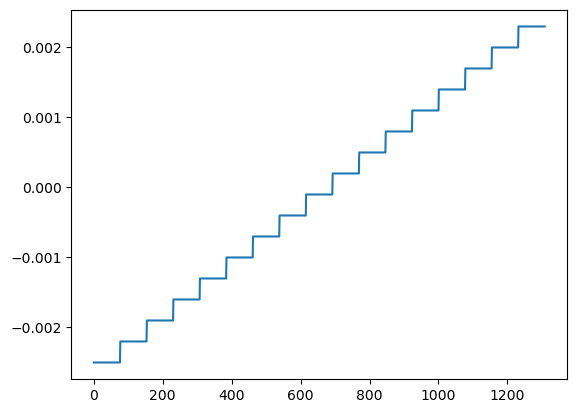

In [60]:
plt.plot(data['posFine'][:,2].flatten())

In [24]:
# Re-import necessary libraries to avoid issues
import numpy as np
import plotly.graph_objects as go

# Recalculate grid_values to ensure data integrity
hydroData_max = np.max(data['hydroData'], axis=0)
hydroData_max_reshaped = hydroData_max.reshape(data['posFine'].shape[0], -1)

grid_values = np.zeros((data['posFine'].shape[0], data['posFine'].shape[1] + 1))
grid_values[:, :3] = data['posFine']
grid_values[:, 3] = hydroData_max_reshaped.flatten()

# Extract x, y, z, and value from grid_values for the plot
x = grid_values[:, 0]
y = grid_values[:, 1]
z = grid_values[:, 2]
value = grid_values[:, 3]

# Debugging with a simple 3D scatter plot in Plotly
fig = go.Figure(data=go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=5,
        color=value,  # Set color based on value
        colorscale='Viridis',
        colorbar=dict(title="Value"),
    )
))

# fig = go.Figure(data=go.Volume(
#         z=z,
#         x=x,
#         y=y,
#         value=hydroData_max.flatten(),
#         isomin=0,
#         isomax=10,
#         # surface_count=50,  # Simplify surface count for visualization
#     ))

# Set axis titles and ranges explicitly
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X', range=[x.min(), x.max()]),
        yaxis=dict(title='Y', range=[y.min(), y.max()]),
        zaxis=dict(title='Z', range=[z.min(), z.max()]),
    ),
    title="3D Scatter Plot Debugging",
)

# Show the scatter plot
fig.show()

In [25]:
from scipy.interpolate import griddata
# 1) Define higher resolution grid
num_points = 50
x_new = np.linspace(x.min(), x.max(), num_points)
y_new = np.linspace(y.min(), y.max(), num_points)
z_new = np.linspace(z.min(), z.max(), num_points)
Xn, Yn, Zn = np.meshgrid(x_new, y_new, z_new, indexing='ij')

# 2) Interpolate data onto the new grid
points_old = np.column_stack((x, y, z))
points_new = np.column_stack((Xn.ravel(), Yn.ravel(), Zn.ravel()))
values_new = griddata(points_old, value, points_new, method='linear')

# 3) Make a volume plot
fig = go.Figure(data=go.Volume(
    x=Xn.ravel(),
    y=Yn.ravel(),
    z=Zn.ravel(),
    value=values_new,
    opacity=0.3,           # Adjust opacity as desired
    isomin=5,
    surface_count=10,      # Number of isosurfaces
    colorscale='Viridis'
))
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interpolated 3D Volume"
)

fig.show()

In [26]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assume Xn, Yn, Zn, values_new, x_new, y_new, z_new already exist
# and have shape (num_points, num_points, num_points)

# Reshape the flattened values to match Xn, Yn, Zn shapes
vals_3d = values_new.reshape(Xn.shape)

# 1) XZ slice around center of y
center_y_idx = len(y_new) // 2
xz_slice_x = Xn[:, center_y_idx, :]
xz_slice_z = Zn[:, center_y_idx, :]
xz_slice_vals = vals_3d[:, center_y_idx, :]

# 2) YZ slice around center of x
center_x_idx = len(x_new) // 2
yz_slice_y = Yn[center_x_idx, :, :]
yz_slice_z = Zn[center_x_idx, :, :]
yz_slice_vals = vals_3d[center_x_idx, :, :]

# Use specs to declare each subplot as 3D
fig = make_subplots(
    rows=1, 
    cols=2, 
    specs=[[{"type": "surface"}, {"type": "surface"}]],
    subplot_titles=["XZ Slice", "YZ Slice"]
)

# Add surfaces
fig.add_trace(
    go.Surface(
        x=xz_slice_x,
        y=xz_slice_z,
        z=np.zeros_like(xz_slice_vals),  
        surfacecolor=xz_slice_vals,
        colorscale="Viridis",
        showscale=True
    ),
    row=1, col=1
)

fig.add_trace(
    go.Surface(
        x=yz_slice_y,
        y=yz_slice_z,
        z=np.zeros_like(yz_slice_vals),
        surfacecolor=yz_slice_vals,
        colorscale="Viridis",
        showscale=True
    ),
    row=1, col=2
)

fig.update_layout(
    title="2.5D Slices (XZ & YZ)"
)
fig.show()

In [27]:
import plotly.graph_objects as go
import numpy as np

# Assume Xn, Yn, Zn, values_new, x_new, y_new, z_new already exist
# and have shape (num_points, num_points, num_points)

# Reshape the flattened values to match Xn, Yn, Zn shapes
vals_3d = values_new.reshape(Xn.shape)

# 1) XZ slice around the center of y
center_y_idx = len(y_new) // 2
xz_slice_x = Xn[:, center_y_idx, :]
xz_slice_z = Zn[:, center_y_idx, :]
xz_slice_vals = vals_3d[:, center_y_idx, :]

# 2) YZ slice around the center of x
center_x_idx = len(x_new) // 2
yz_slice_y = Yn[center_x_idx, :, :]
yz_slice_z = Zn[center_x_idx, :, :]
yz_slice_vals = vals_3d[center_x_idx, :, :]

# Create the 3D plot with slices positioned in 3D space
fig = go.Figure()

# Add the XZ slice (oriented in the XZ plane, aligned with Y=center_y_idx)
fig.add_trace(
    go.Surface(
        x=xz_slice_x,
        y=np.full_like(xz_slice_vals, y_new[center_y_idx]),  # Constant Y value
        z=xz_slice_z,  # Z remains as is
        surfacecolor=xz_slice_vals,
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(title="Values (XZ Slice)")
    )
)

# Add the YZ slice (oriented in the YZ plane, aligned with X=center_x_idx)
fig.add_trace(
    go.Surface(
        x=np.full_like(yz_slice_vals, x_new[center_x_idx]),  # Constant X value
        y=yz_slice_y,  # Y remains as is
        z=yz_slice_z,  # Z remains as is
        surfacecolor=yz_slice_vals,
        colorscale="Viridis",
        showscale=True,
        colorbar=dict(title="Values (YZ Slice)")
    )
)

# Update layout for proper 3D visualization
fig.update_layout(
    title="3D Visualization of XZ and YZ Slices",
    scene=dict(
        xaxis_title="X",
        yaxis_title="Y",
        zaxis_title="Z",
    )
)

# Show the plot
fig.show()
